<a href="https://colab.research.google.com/github/funnycrown42-max/fly-paint/blob/main/examples/01_flyvision_connectome.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Connectome
This notebook illustrates the constructed spatially invariant connectome from local reconstructions that builds the
scaffold of the network.

**Select GPU runtime**

To run the notebook on a GPU select Menu -> Runtime -> Change runtime type -> GPU.

In [1]:
# @markdown **Check access to GPU**

try:
    import google.colab

    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    import torch

    try:
        cuda_name = torch.cuda.get_device_name()
        print(f"Name of the assigned GPU / CUDA device: {cuda_name}")
    except RuntimeError:
        import warnings

        warnings.warn(
            "You have not selected Runtime Type: 'GPU' or Google could not assign you one. Please revisit the settings as described above or proceed on CPU (slow)."
        )

Name of the assigned GPU / CUDA device: NVIDIA A100-SXM4-80GB


**Install Flyvis**

The notebook requires installing our package `flyvis`. You may need to restart your session after running the code block below with Menu -> Runtime -> Restart session. Then, imports from `flyvis` should succeed without issue.

In [2]:
# @markdown **Install Flyvis**
if IN_COLAB:
    !git clone https://github.com/TuragaLab/flyvis.git
    %cd /content/flyvis
    !pip install -e .[examples]

Cloning into 'flyvis'...
remote: Enumerating objects: 5249, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 5249 (delta 165), reused 159 (delta 140), pack-reused 5015 (from 3)
Receiving objects: 100% (5249/5249), 188.42 MiB | 19.94 MiB/s, done.
Resolving deltas: 100% (2664/2664), done.
/content/flyvis
Obtaining file:///content/flyvis
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.1/163.1 kB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 167.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 157.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.1/118.1 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 947.5/947.5 kB 98.7 MB/

**Download pretrained models**

Running the code block below will download the pretrained models needed for this notebook.

In [3]:
# @markdown **Download pretrained models**
!flyvis download-pretrained

[2026-09-13 07:11:01] utils:164 NumExpr defaulting to 12 threads.
[2026-09-13 07:11:16] __init__:49 file_cache is only supported with oauth2client<4.0.0
Progress results_umap_and_clustering.zip: 100%
Checksum OK for results_umap_and_clustering.zip.
Unpacked results_umap_and_clustering.zip.
Progress results_pretrained_models.zip: 100%
Checksum OK for results_pretrained_models.zip.
Unpacked results_pretrained_models.zip.


# The connectome from average local reconstructions

In [4]:
from flyvis import connectome_file
from flyvis import ConnectomeFromAvgFilters, ConnectomeView

In [5]:
# The ConnectomeFromAvgFilters class compiles the network graph from `data/connectome/fib25-fib19_v2.2.json`.
# This json-file includes a list of cell types (`nodes`) and average convolutional filters
# (anatomical receptive fields) (`edges`) that are scattered across a regular hexagonal lattice
# of 15 column extent and stored on the hierarchical filesystem as h5-files.
config = dict(file=connectome_file.name, extent=15, n_syn_fill=1)
connectome = ConnectomeFromAvgFilters(config)

In [6]:
# our network models 45,669 cells represented in this table of nodes
print(connectome.nodes.to_df().iloc[0:20].to_markdown())

|    | type   |   v |   index | role   |   u |
|---:|:-------|----:|--------:|:-------|----:|
|  0 | R1     |   0 |       0 | input  | -15 |
|  1 | R1     |   1 |       1 | input  | -15 |
|  2 | R1     |   2 |       2 | input  | -15 |
|  3 | R1     |   3 |       3 | input  | -15 |
|  4 | R1     |   4 |       4 | input  | -15 |
|  5 | R1     |   5 |       5 | input  | -15 |
|  6 | R1     |   6 |       6 | input  | -15 |
|  7 | R1     |   7 |       7 | input  | -15 |
|  8 | R1     |   8 |       8 | input  | -15 |
|  9 | R1     |   9 |       9 | input  | -15 |
| 10 | R1     |  10 |      10 | input  | -15 |
| 11 | R1     |  11 |      11 | input  | -15 |
| 12 | R1     |  12 |      12 | input  | -15 |
| 13 | R1     |  13 |      13 | input  | -15 |
| 14 | R1     |  14 |      14 | input  | -15 |
| 15 | R1     |  15 |      15 | input  | -15 |
| 16 | R1     |  -1 |      16 | input  | -14 |
| 17 | R1     |   0 |      17 | input  | -14 |
| 18 | R1     |   1 |      18 | input  | -14 |
| 19 | R1    

In [7]:
# our network models 1,513,231 synapses represented in this table of edges
print(connectome.edges.to_df().iloc[0:20].to_markdown())

|    |   target_index |   source_u |   dv |   source_index |   sign | source_type   | target_type   |   target_u |   source_v |   target_v |   du |   n_syn |   n_syn_certainty |
|---:|---------------:|-----------:|-----:|---------------:|-------:|:--------------|:--------------|-----------:|-----------:|-----------:|-----:|--------:|------------------:|
|  0 |           5768 |        -15 |    0 |              0 |     -1 | R1            | L1            |        -15 |          0 |          0 |    0 |      40 |           5.85948 |
|  1 |           5769 |        -15 |    0 |              1 |     -1 | R1            | L1            |        -15 |          1 |          1 |    0 |      40 |           5.85948 |
|  2 |           5770 |        -15 |    0 |              2 |     -1 | R1            | L1            |        -15 |          2 |          2 |    0 |      40 |           5.85948 |
|  3 |           5771 |        -15 |    0 |              3 |     -1 | R1            | L1            |        -

## Connectivity between identified cell types

Identified connectivity between 64 cell types, represented by total number of input synapses from all neurons of a given presynaptic cell type to a single postsynaptic of a given cell type. Blue color indicates putative hyperpolarizing inputs, red putative depolarizing inputs as inferred from neurotransmitter and receptor profiling. Size of squares indicates number of input synapses.

In [8]:
# the ConnectomeView class provides visualizations of the connectome data
connectome_view = ConnectomeView(connectome)

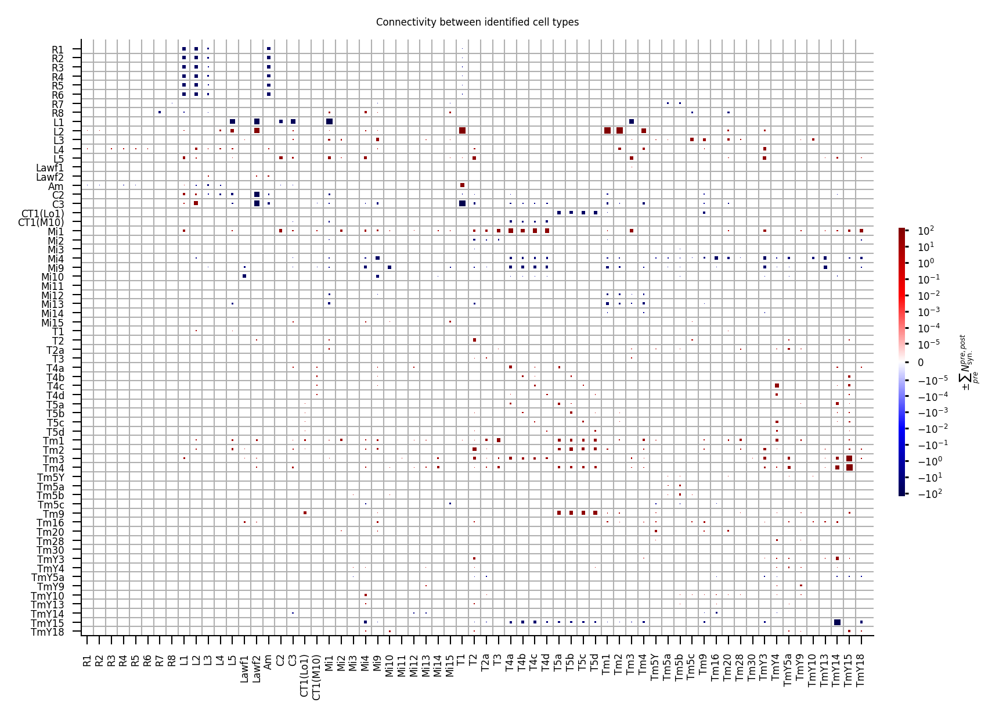

In [9]:
fig = connectome_view.connectivity_matrix("n_syn")

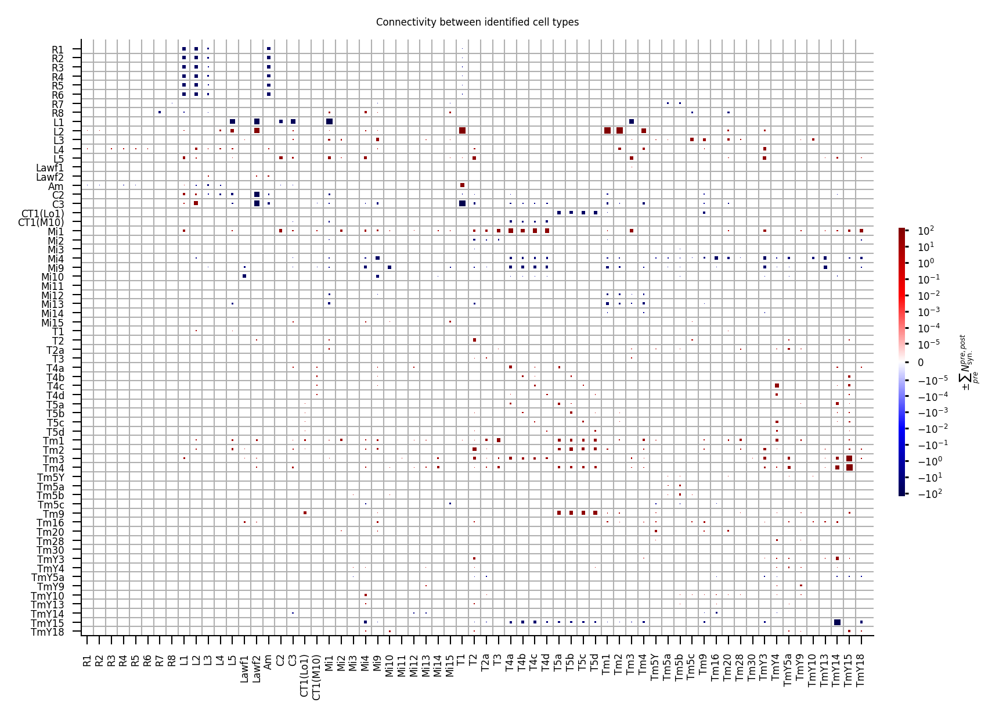

In [ ]:
fig = connectome_view.connectivity_matrix("n_syn")

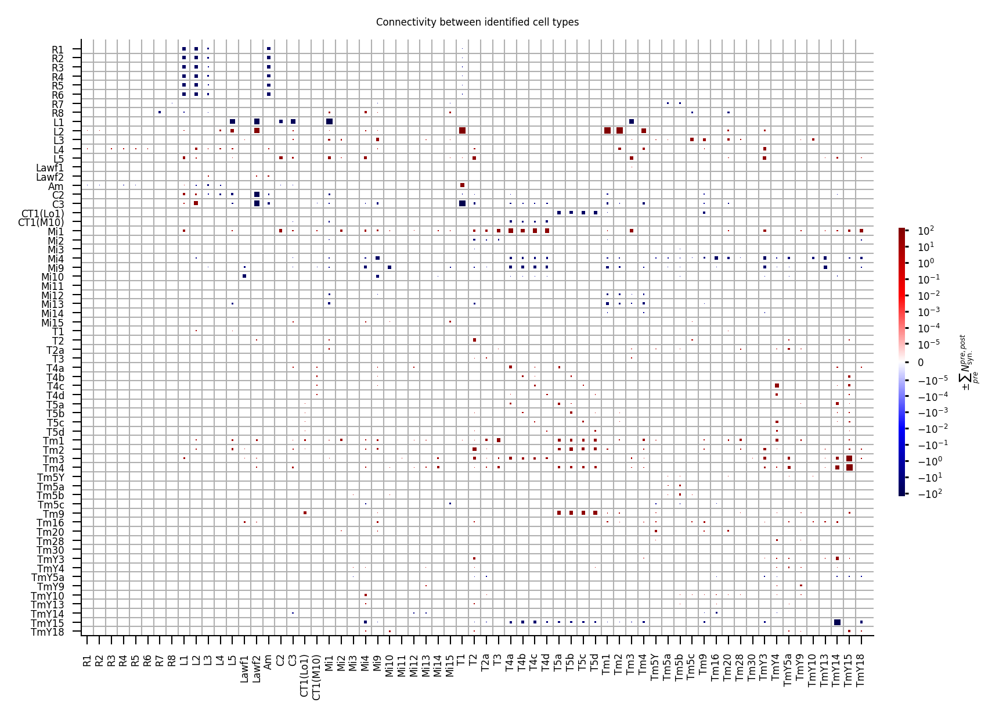

In [ ]:
fig = connectome_view.connectivity_matrix("n_syn")

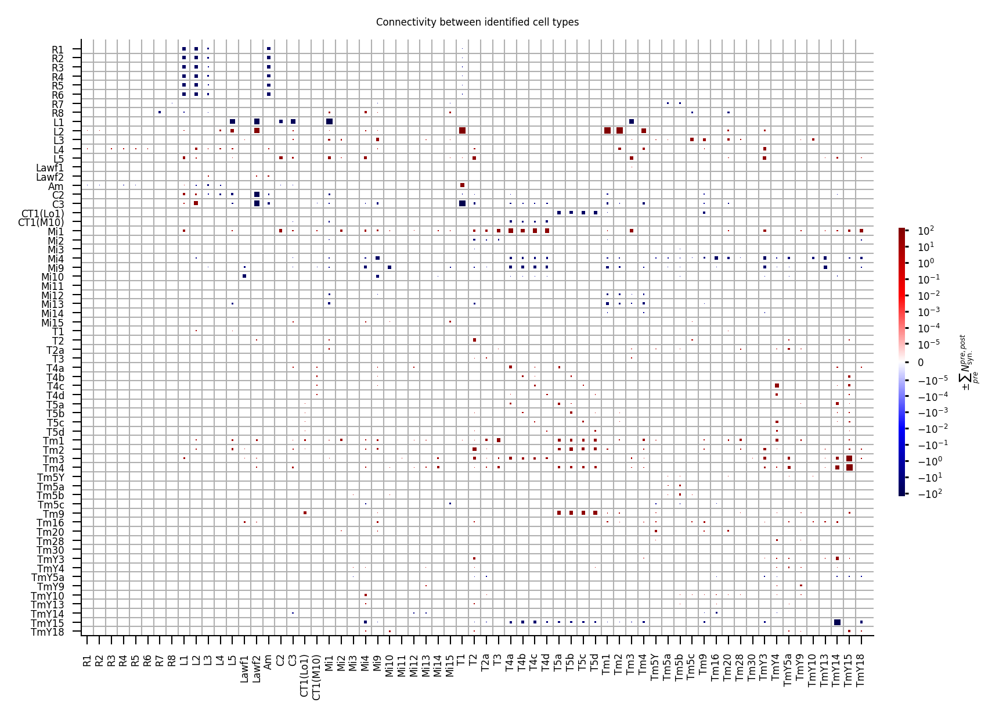

In [ ]:
fig = connectome_view.connectivity_matrix("n_syn")

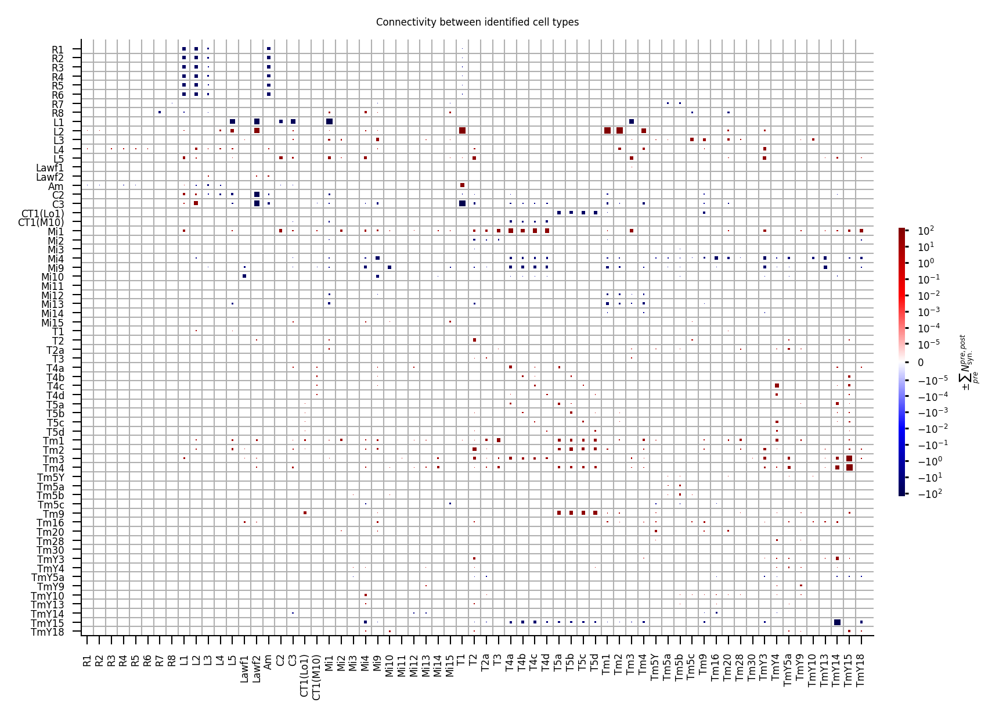

In [ ]:
fig = connectome_view.connectivity_matrix("n_syn")

## Example receptive fields
Example of convolutional filter, representing inputs onto cells of the target cell type. Values represent the average number of synapses projecting from presynaptic cells in columns with indicated offset onto the postsynaptic dendrite. Values indicate connection strength derived from electron microscopy data.

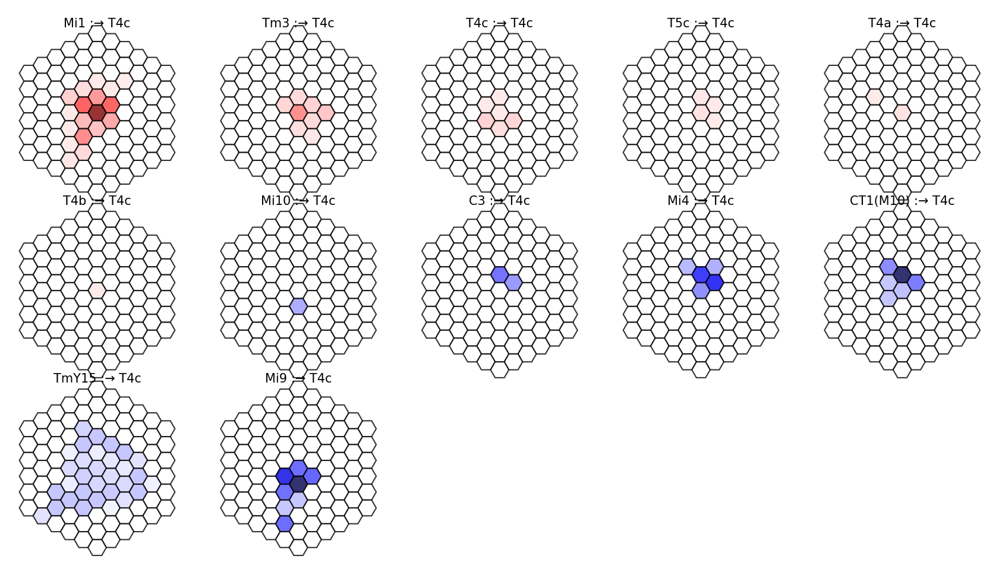

In [10]:
fig = connectome_view.receptive_fields_grid("T4c")

## Example projective fields
Example of projective fields, representing outputs of a source cell type onto target cells. Values represent the average number of synapses projecting from the presynaptic cell onto postsynaptic dendrites in columns with indicated offset. Values indicate connection strength derived from electron microscopy data.

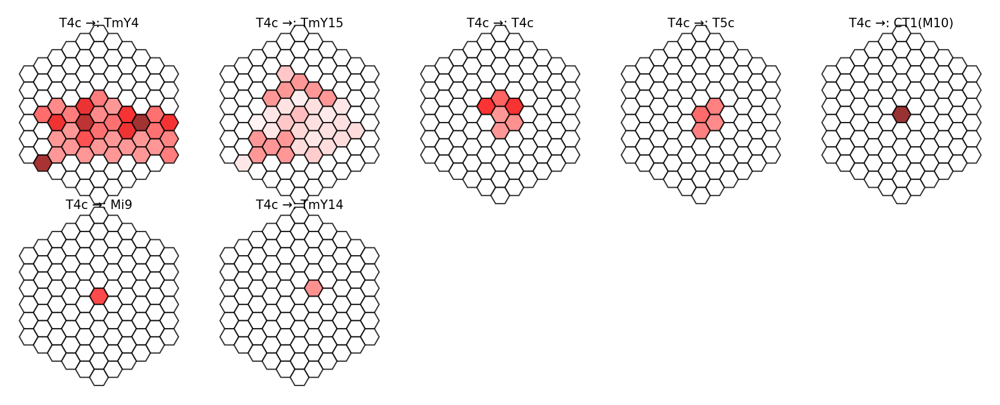

In [11]:
fig = connectome_view.projective_fields_grid("T4c")

## Network layout

Our retinotopic hexagonal lattice network organizes cells of each cell type into visual columns corresponding to photoreceptor locations to capture the crystalline, hexagonal structure of the fly eye. Some cell types are non-columnar, i.e. their cells occur only in every other column---here Lawf1 and Lawf2 cell types---as estimated by our connectome construction algorithm. The edges represent pairs of connected cell types. For the task, we decoded from T-shaped and transmedullary cells (within the black box).

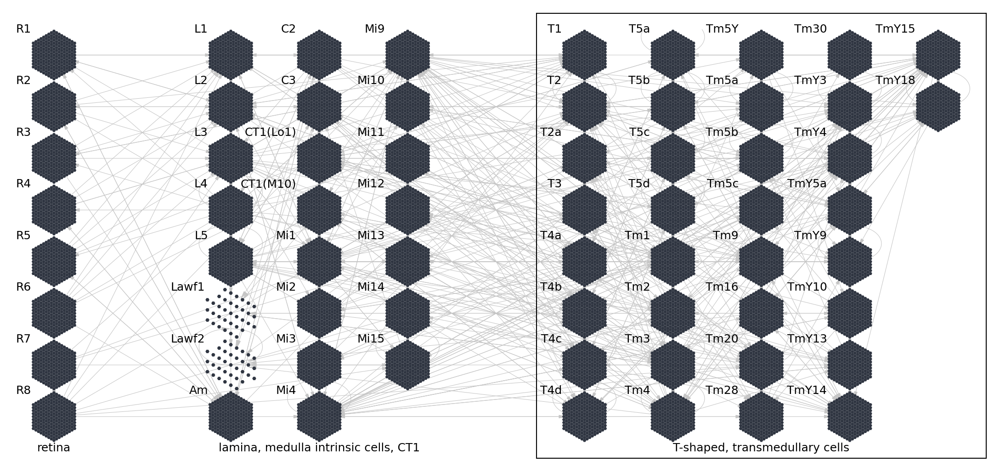

In [14]:
# cause the layout is spatially periodic it suffices to visualize a few columns
# to get the gist of the layout which can be controlled using max_extent
fig = connectome_view.network_layout(max_extent=8)

In [19]:
from flyvis import Network

# The Network initialization expects a 'type' key in the connectome config
network_config = config.copy()
network_config["type"] = "ConnectomeFromAvgFilters"

# Create a network model using the connectome configuration
network = Network(connectome=network_config)

print("Network successfully initialized!")


Network successfully initialized!


In [20]:
import flyvis

print("Flyvis accessible modules/attributes:")
print([m for m in dir(flyvis) if not m.startswith('_')])

print("\nNetwork methods and attributes:")
print([m for m in dir(network) if not m.startswith('_')])


Flyvis accessible modules/attributes:
['ActivityDecoder', 'AugmentedSintel', 'CentralImpulses', 'CheckpointedNetwork', 'ConnectomeFromAvgFilters', 'ConnectomeView', 'DataLoader', 'DecoderGAVP', 'Dict', 'Dots', 'Ensemble', 'EnsembleDir', 'EnsembleView', 'Flashes', 'HyperParamScheduler', 'IndexSampler', 'InitialDistribution', 'Lognormal', 'MovingBar', 'MovingEdge', 'MultiTaskDataset', 'MultiTaskSintel', 'MultiTaskSolver', 'Namespace', 'Network', 'NetworkDir', 'NetworkDynamics', 'NetworkView', 'Normal', 'PPNeuronIGRSynapses', 'Parameter', 'Path', 'Penalty', 'ProjectiveFields', 'ReceptiveFields', 'RenderedFlashes', 'RenderedOffsets', 'RenderedSintel', 'RestingPotential', 'SequenceDataset', 'SpatialImpulses', 'Stimulus', 'StimulusDataset', 'SynapseCount', 'SynapseCountScaling', 'SynapseSign', 'Task', 'TimeConstant', 'Value', 'analysis', 'augmentation', 'clustering', 'config_dir', 'connectome', 'connectome_file', 'datasets', 'datetime', 'decoder', 'device', 'directories', 'dotenv', 'dots', '

In [27]:
from flyvis import MovingBar

# Try to initialize with default parameters
stimulus = MovingBar()
print("Stimulus created successfully!")

# MovingBar acts as a dataset, let's access the first generated stimulus
item = stimulus[0]
print(f"Type of item: {type(item)}")

if isinstance(item, tuple):
    stimulus_tensor = item[0]
else:
    stimulus_tensor = item

print(f"Original Tensor shape: {getattr(stimulus_tensor, 'shape', 'Unknown')}")

# Reshape to (sample, frame, 1, hexals) -> e.g., (1, 1078, 1, 721)
stimulus_tensor_4d = stimulus_tensor.unsqueeze(0).unsqueeze(2)
print(f"Reshaped Tensor shape: {stimulus_tensor_4d.shape}")

# Simulate the network response by passing the reshaped tensor and its dt
response = network.simulate(stimulus_tensor_4d, dt=stimulus.dt)
print("Simulation completed!")
print("Response type:", type(response))


Stimulus created successfully!
Type of item: <class 'torch.Tensor'>
Original Tensor shape: torch.Size([1078, 721])
Reshaped Tensor shape: torch.Size([1, 1078, 1, 721])
Simulation completed!
Response type: <class 'torch.Tensor'>


Raw response shape: (1, 1078, 45669)
Found 721 T4c cells.


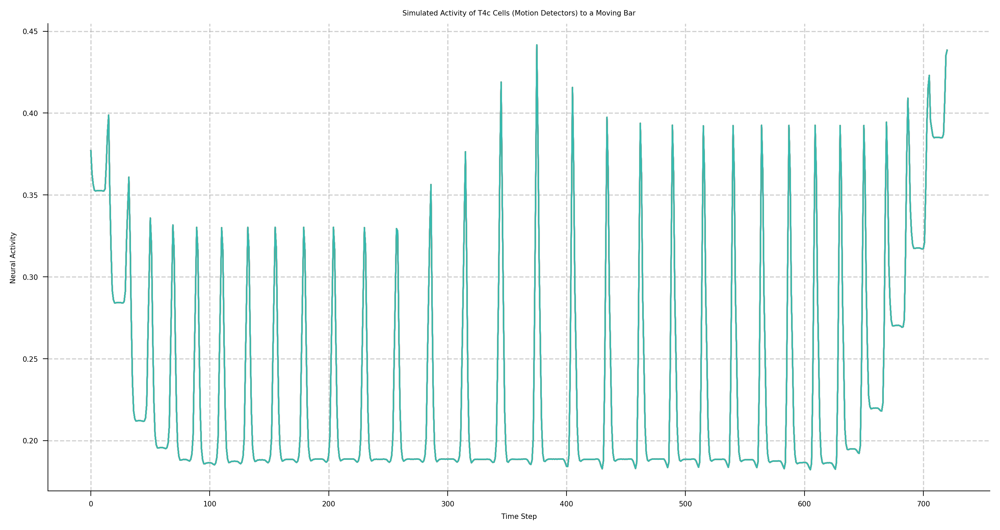

In [28]:
import matplotlib.pyplot as plt

# Convert the response tensor to a numpy array for plotting
# The shape is typically (batch, time, cells)
resp_np = response.detach().cpu().numpy()
print(f"Raw response shape: {resp_np.shape}")

# Get the indices of the T4c cells from our connectome
nodes_df = connectome.nodes.to_df()
t4c_indices = nodes_df[nodes_df['type'] == 'T4c']['index'].values

print(f"Found {len(t4c_indices)} T4c cells.")

if len(t4c_indices) > 0:
    # Extract the activity for T4c cells
    # Handling depending on the exact dimensions of the response tensor
    if resp_np.ndim == 3:
        t4c_activity = resp_np[0, :, t4c_indices]
    elif resp_np.ndim == 2:
        t4c_activity = resp_np[:, t4c_indices]
    else:
        t4c_activity = resp_np[..., t4c_indices].squeeze()

    # Plot the responses of a subset of these cells (e.g., the first 10)
    plt.figure(figsize=(12, 6))
    plt.plot(t4c_activity[:, :10], alpha=0.8)
    plt.title('Simulated Activity of T4c Cells (Motion Detectors) to a Moving Bar')
    plt.xlabel('Time Step')
    plt.ylabel('Neural Activity')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
else:
    print("Could not find T4c cells in this connectome configuration.")


In [30]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
import numpy as np

# Get T4c cells to extract their spatial coordinates (u, v)
t4c_nodes = nodes_df[nodes_df['type'] == 'T4c']
u = t4c_nodes['u'].values
v = t4c_nodes['v'].values

# Convert hexagonal (u,v) coordinates to Cartesian (x,y) for scatter plotting
x = u + v / 2.0
y = v * np.sqrt(3) / 2.0

stim_np = stimulus_tensor.cpu().numpy()

# Fix potential transposition from numpy advanced indexing in the previous cell
if t4c_activity.shape[0] != stim_np.shape[0]:
    t4c_activity = t4c_activity.T

# Downsample frames to make the animation generate faster (skip every 4 frames)
skip_frames = 4
stim_frames = stim_np[::skip_frames, :]
t4c_frames = t4c_activity[::skip_frames, :]
num_frames = stim_frames.shape[0]

# Set up the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Processing of Visual Stimulus by T4c Cells', fontsize=16)

# Stimulus Plot (Left)
scat1 = ax1.scatter(x, y, c=stim_frames[0], cmap='gray', s=40,
                    vmin=stim_np.min(), vmax=stim_np.max())
ax1.set_title("Input: Moving Bar")
ax1.axis('equal')
ax1.axis('off')

# T4c Activity Plot (Right)
# Use 99th percentile for vmax to avoid a single outlier dimming the whole animation
vmax_t4c = np.percentile(t4c_activity, 99)
scat2 = ax2.scatter(x, y, c=t4c_frames[0], cmap='magma', s=40,
                    vmin=t4c_activity.min(), vmax=vmax_t4c)
ax2.set_title("Output: T4c Neural Activity")
ax2.axis('equal')
ax2.axis('off')

# Update function for the animation
def update(frame):
    scat1.set_array(stim_frames[frame])
    scat2.set_array(t4c_frames[frame])
    return scat1, scat2

print(f"Generating animation with {num_frames} frames... This may take a minute.")

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=50, blit=True)
plt.close(fig) # Prevent the initial static plot from rendering twice

# Display the animation as an HTML5 video
display(HTML(ani.to_html5_video()))


Generating animation with 270 frames... This may take a minute.


In [31]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display

# 1. Create a simplified 8x8 chessboard and a mock game sequence
frames = 40
board = np.zeros((8, 8))
# Create checkerboard pattern
board[1::2, ::2] = 1
board[::2, 1::2] = 1

game_states = []
piece_pos = [0, 0]

# Simulate a piece (value=2) moving across the board
for i in range(frames):
    state = board.copy()
    state[piece_pos[0], piece_pos[1]] = 2 # Represent a moving piece
    game_states.append(state)

    # Move piece in a zig-zag pattern
    if i % 4 == 0 and piece_pos[0] < 7:
        piece_pos[0] += 1
    elif piece_pos[1] < 7:
        piece_pos[1] += 1
    else:
        piece_pos[0] = max(0, piece_pos[0] - 1)

game_states = np.array(game_states)

# 2. Mock "Neural Network" Activity
# Let's pretend we have a dense neural layer of 100 neurons (10x10 grid) evaluating the board
np.random.seed(42)
# Random weights mapping the 64 squares to 100 neurons
weights = np.random.randn(100, 64)

neural_activity = []
for state in game_states:
    flat_state = state.flatten()
    # Simple artificial neuron logic: ReLU(Weights * Board) + noise
    act = np.maximum(0, weights @ flat_state) + np.random.randn(100) * 0.5
    neural_activity.append(act.reshape(10, 10))

neural_activity = np.array(neural_activity)

# 3. Create the Side-by-Side Animation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('Chess Board vs. AI Neural Activity', fontsize=16)

# Left: Chess Game
im1 = ax1.imshow(game_states[0], cmap='cividis', vmin=0, vmax=2)
ax1.set_title("Input: Chess Game State")
ax1.axis('off')

# Right: Neural Network
im2 = ax2.imshow(neural_activity[0], cmap='magma', vmin=0, vmax=np.percentile(neural_activity, 95))
ax2.set_title("Output: Neural Network Layer")
ax2.axis('off')

def update(frame):
    im1.set_array(game_states[frame])
    im2.set_array(neural_activity[frame])
    return im1, im2

print("Generating Chess AI animation...")
ani = animation.FuncAnimation(fig, update, frames=frames, interval=150, blit=True)
plt.close(fig)

# Display the animation
display(HTML(ani.to_html5_video()))


Generating Chess AI animation...


In [32]:
# Install the python-chess library for real game logic and pieces
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 156.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for chess: filename=chess-1.11.2-py3-none-any.whl size=147775 sha256=2452b3f77fa9f8948d118b67b6740c52063c7cb815d07c68146d30549ddf09f9
  Stored in directory: /root/.cache/pip/wheels/83/1f/4e/8f4300f7dd554eb8de70ddfed96e94d3d030ace10c5b53d447
Successfully built chess


In [34]:
import chess
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
from mpl_toolkits.mplot3d import Axes3D

# 1. Setup a real chess game and record states
board = chess.Board()
# A valid short sequence of moves
moves = ['e4', 'e5', 'Nf3', 'Nc6', 'Bc4', 'Bc5', 'd3', 'Nf6', 'Nc3', 'd6', 'Bg5', 'h6', 'Bxf6', 'Qxf6']

boards = [board.copy()]
for move in moves:
    board.push_san(move)
    boards.append(board.copy())

num_frames = len(boards)

# 2. Setup the Neural Network Mock (Mapping 64 squares to 100 neurons in a 10x10 3D grid)
np.random.seed(42)
weights = np.random.randn(100, 64)
X, Y = np.meshgrid(np.arange(10), np.arange(10))

# Convert board to numeric array for the "Network"
def board_to_array(b):
    arr = np.zeros(64)
    for i in range(64):
        piece = b.piece_at(i)
        if piece:
            # Just a simple mapping: white positive, black negative
            val = piece.piece_type if piece.color == chess.WHITE else -piece.piece_type
            arr[i] = val
    return arr

Z_frames = []
for b in boards:
    flat_state = board_to_array(b)
    # Compute layer activity: ReLU(weights * state) + smoothing
    act = np.maximum(0, weights @ flat_state)
    act = act.reshape(10, 10)
    # Apply a little gaussian smoothing to make the 3D surface look organic
    from scipy.ndimage import gaussian_filter
    act = gaussian_filter(act, sigma=0.8)
    Z_frames.append(act)

z_max = np.max(Z_frames) * 1.1

# Unicode mapping for pretty pieces
UNICODE_PIECES = {
    'P': '♙', 'N': '♘', 'B': '♗', 'R': '♖', 'Q': '♕', 'K': '♔',
    'p': '♟', 'n': '♞', 'b': '♝', 'r': '♜', 'q': '♛', 'k': '♚'
}

# 3. Create the Visualization
fig = plt.figure(figsize=(14, 6))
fig.suptitle('AI Chess Evaluation: 3D Neural Landscape', fontsize=18, fontweight='bold')

# Left: Chessboard
ax1 = fig.add_subplot(1, 2, 1)
ax1.set_aspect('equal')
ax1.set_xlim(-0.5, 7.5)
ax1.set_ylim(-0.5, 7.5)
ax1.axis('off')
ax1.set_title("Input: Live Game State", fontsize=14)

# Right: 3D Neural Activity
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
ax2.set_zlim(0, z_max)
ax2.set_axis_off() # Hide the messy grid lines for a cleaner look
ax2.set_title("Output: 3D Activation Surface", fontsize=14, pad=20)

# Keep track of surface for animation
surf_plot = [None]

def draw_board(b):
    ax1.clear()
    ax1.set_xlim(-0.5, 7.5)
    ax1.set_ylim(-0.5, 7.5)
    ax1.axis('off')
    ax1.set_title("Input: Live Game State", fontsize=14)

    # Draw squares
    for i in range(8):
        for j in range(8):
            color = '#DDB88C' if (i + j) % 2 == 0 else '#A66D4F'
            rect = plt.Rectangle((i-0.5, j-0.5), 1, 1, facecolor=color, edgecolor='none')
            ax1.add_patch(rect)

            # Draw piece
            square = chess.square(i, j)
            piece = b.piece_at(square)
            if piece:
                char = UNICODE_PIECES[piece.symbol()]
                # Black pieces are bolded visually in standard unicode,
                # but we can set color explicitly for contrast
                p_color = 'white' if piece.color == chess.WHITE else 'black'
                ax1.text(i, j, char, fontsize=36, ha='center', va='center',
                         color=p_color, fontweight='bold')

def update(frame):
    # 1. Update Board
    draw_board(boards[frame])

    # 2. Update 3D Surface
    if surf_plot[0] is not None:
        surf_plot[0].remove()
    surf_plot[0] = ax2.plot_surface(X, Y, Z_frames[frame], cmap='magma',
                                    linewidth=0, antialiased=True,
                                    rstride=1, cstride=1, alpha=0.9)
    # Slowly rotate the 3D view for extra flair
    ax2.view_init(elev=45, azim=frame * 4)

print(f"Rendering advanced 3D chess animation ({num_frames} frames)...")
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=800, blit=False)
plt.close(fig)

# Display the high-quality animation
display(HTML(ani.to_html5_video()))

Rendering advanced 3D chess animation (15 frames)...


### Dreaming up the Optimal Stimulus
Here we perform gradient ascent on a random noise input. We ask the network to "paint" the exact visual sequence that maximally excites a target motion-detector neuron (T4c).

In [35]:
import torch
from torch.optim import Adam
from tqdm.auto import tqdm
import numpy as np

# Find the device the network is on (CPU or GPU)
device = next(network.parameters()).device

# Choose a target T4c neuron near the center of the visual field
# We use the x and y coordinates we calculated for the hexagonal grid earlier
center_idx = np.argmin(x**2 + y**2)
target_neuron_global_idx = t4c_indices[center_idx]

# Create a random noise stimulus (batch, time, 1, hexals)
frames = 40
dt = 0.010 # 10 ms per frame

# Initialize with gray noise (values between 0.4 and 0.6)
optimal_stim = torch.rand((1, frames, 1, 721), device=device) * 0.2 + 0.4
optimal_stim.requires_grad = True

# We will use the Adam optimizer to modify the stimulus
optimizer = Adam([optimal_stim], lr=0.05)

print(f"Dreaming optimal stimulus for T4c cell {center_idx} (Global ID: {target_neuron_global_idx})...")
network.eval() # Set network to evaluation mode

# Run Gradient Ascent
for step in tqdm(range(100), desc="Painting Stimulus"):
    optimizer.zero_grad()

    # Simulate the network response to the current stimulus
    response = network.simulate(optimal_stim, dt=dt)

    # Maximize the mean activity of the target neuron in the last 10 frames
    target_activity = response[0, -10:, target_neuron_global_idx].mean()

    # We minimize the negative activity to perform gradient ascent
    loss = -target_activity
    loss.backward()

    # Update the stimulus pixels
    optimizer.step()

    # Keep the visual stimulus in the valid physical range [0, 1] (dark to bright)
    with torch.no_grad():
        optimal_stim.clamp_(0, 1)

print(f"Final target neuron activity: {-loss.item():.4f}")

Dreaming optimal stimulus for T4c cell 360 (Global ID: 25841)...


Painting Stimulus:   0%|          | 0/100 [00:00<?, ?it/s]

Final target neuron activity: 0.1896


In [36]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display

# Extract the 'painted' stimulus from the optimized tensor
painted_stim_np = optimal_stim.detach().cpu().numpy()[0, :, 0, :]

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("What the Fly Brain Wants to See", fontsize=18, fontweight='bold')
ax.set_title("Optimal 'Dreamt' Stimulus for a single T4c Motion Detector", fontsize=12, pad=10)

# Plot the stimulus on the hexagonal grid
scat = ax.scatter(x, y, c=painted_stim_np[0], cmap='gray', s=100, vmin=0, vmax=1)
ax.axis('equal')
ax.axis('off')

# Mark the target neuron's spatial location
ax.plot(x[center_idx], y[center_idx], 'r+', markersize=20, markeredgewidth=3, label='Target T4c Neuron')
ax.legend(loc='upper right')

def update(frame):
    scat.set_array(painted_stim_np[frame])
    return scat,

print("Rendering the fly's dream animation...")
ani = animation.FuncAnimation(fig, update, frames=frames, interval=100, blit=True)
plt.close(fig)

# Display the animation
display(HTML(ani.to_html5_video()))

Rendering the fly's dream animation...


### The Fly's Dream: Stylized Continuous Painting
Here we transform the discrete, scattered hexagonal pixels into a smooth, high-resolution continuous image to better understand the moving geometric pattern the AI generated.

In [38]:
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter

# 1. Create a dense, high-resolution Cartesian canvas
grid_x, grid_y = np.mgrid[x.min():x.max():200j, y.min():y.max():200j]

fig, ax = plt.subplots(figsize=(8, 8))
fig.suptitle("The Fly's Dream: Stylized Continuous Painting", fontsize=18, fontweight='bold')
ax.set_title("Interpolated and Smoothed Stimulus", fontsize=12, pad=10)
ax.axis('off')

# 2. Function to turn hexagonal scatter data into a smooth "painted" image
def paint_frame(frame_data):
    # Interpolate scattered hex data to the dense grid
    # We use fill_value to handle the edges of the hexagonal eye gracefully
    grid_z = griddata((x, y), frame_data, (grid_x, grid_y), method='cubic', fill_value=np.mean(frame_data))

    # Apply a Gaussian filter to blend the "brush strokes" together organically
    grid_z_smooth = gaussian_filter(grid_z, sigma=2.0)
    return grid_z_smooth

# Initialize the first frame
initial_canvas = paint_frame(painted_stim_np[0])

# We use 'magma' for a highly stylized, painted DeepDream aesthetic
im = ax.imshow(initial_canvas.T, extent=(x.min(), x.max(), y.min(), y.max()),
               origin='lower', cmap='magma', vmin=0, vmax=1)

# Add the target neuron marker back on top
ax.plot(x[center_idx], y[center_idx], 'r+', markersize=20, markeredgewidth=2, alpha=0.5)

def update_art(frame):
    canvas = paint_frame(painted_stim_np[frame])
    im.set_array(canvas.T)
    return im,

print("Rendering the smoothed painting animation...")
ani_art = animation.FuncAnimation(fig, update_art, frames=frames, interval=100, blit=True)
plt.close(fig)

# Display the artistic animation
display(HTML(ani_art.to_html5_video()))

Rendering the smoothed painting animation...


### Exploring `streaming-fly-throughts`
Let's clone the repository you suggested and see what it contains.

In [39]:
import os

repo_url = "https://github.com/blendi-remade/streaming-fly-throughts"
repo_name = repo_url.split('/')[-1]

if not os.path.exists(repo_name):
    !git clone {repo_url}
else:
    print(f"Repository {repo_name} already cloned.")

# Let's check what files are inside to figure out our next steps
print(f"\nContents of {repo_name}:")
!ls -la {repo_name}

Cloning into 'streaming-fly-throughts'...
remote: Enumerating objects: 262, done.
remote: Counting objects: 100% (262/262), done.
remote: Compressing objects: 100% (207/207), done.
remote: Total 262 (delta 26), reused 260 (delta 24), pack-reused 0 (from 0)
Receiving objects: 100% (262/262), 28.85 MiB | 11.90 MiB/s, done.
Resolving deltas: 100% (26/26), done.

Contents of streaming-fly-throughts:
total 116
drwxr-xr-x  9 root root  4096 Sep 13 06:31 .
drwxr-xr-x 12 root root  4096 Sep 13 06:31 ..
-rw-r--r--  1 root root  4505 Sep 13 06:31 build.gradle
-rw-r--r--  1 root root  5145 Sep 13 06:31 CHANGELOG.md
drwxr-xr-x  8 root root  4096 Sep 13 06:31 cinema
drwxr-xr-x  5 root root  4096 Sep 13 06:31 docs
drwxr-xr-x  8 root root  4096 Sep 13 06:31 .git
-rw-r--r--  1 root root   214 Sep 13 06:31 .gitattributes
drwxr-xr-x  3 root root  4096 Sep 13 06:31 .github
-rw-r--r--  1 root root   487 Sep 13 06:31 .gitignore
drwxr-xr-x  3 root root  4096 Sep 13 06:31 gradle
-rw-r--r--  1 root root   403

In [40]:
# Read the documentation to understand how to use this tool
!cat streaming-fly-throughts/README.md

print('\n' + '='*80 + '\n')

# Inspect the source code directory
print('Contents of src/')
!ls -la streaming-fly-throughts/src

# Fly / Thoughts

A simulated fruit fly nervous system directing live video.

Fly / Thoughts connects a spiking neural network to an interactive Three.js laboratory and MiniMax H3 Director through fal. Give the model sugar, bitterness, a looming shadow, touch, or odor. The app reads the resulting neural activity and turns it into cinematic directions.

The premise is streaming a fly's thoughts. The implementation is a visualization of a computational model, not a recording of a living fly or a decoder of mental images. The network supplies behavioral readouts. We author the setting, visual metaphors, and cinematic style.

![The Three.js laboratory, procedural fly, monitor, and night skyline](cinema/docs/observatory.png)

## How it works

1. A local Java process loads the bundled connectome and runs a leaky integrate-and-fire network.
2. The controls deliver inputs through the model's sensory encoders.
3. The bridge reports population firing rates, spike counts, and modeled motor output

### Neural Video Generation with Stable Video Diffusion
We use the open-weights Stable Video Diffusion (SVD) model to animate the initial "dream" frame into a cinematic video, running entirely locally on our GPU.

In [46]:
!pip install -q diffusers transformers accelerate imageio[ffmpeg]

import torch
from diffusers import StableVideoDiffusionPipeline
from PIL import Image
import numpy as np
from IPython.display import HTML, display
import base64
import os
import imageio

# 1. Load the SVD Pipeline
print("Loading Stable Video Diffusion pipeline...")
pipe = StableVideoDiffusionPipeline.from_pretrained(
    "stabilityai/stable-video-diffusion-img2vid-xt",
    torch_dtype=torch.float16,
    variant="fp16"
)
pipe.enable_model_cpu_offload()

# Fix: Disable the internal watermarker which causes the tensor-to-numpy error on CUDA
pipe.watermarker = None

# 2. Prepare the input image from our fly's dream canvas
# Convert the 0-1 canvas to a 0-255 uint8 image
img_array = (initial_canvas.T * 255).astype(np.uint8)

# Map the single channel to RGB
img_rgb = np.stack([img_array]*3, axis=-1)
image = Image.fromarray(img_rgb)

# SVD prefers standard resolutions, we'll resize it to 1024x576
image = image.resize((1024, 576), Image.LANCZOS)

# 3. Generate the video
print("Generating video frames with SVD... This will take a moment.")
output = pipe(
    image,
    decode_chunk_size=8,
    generator=torch.Generator("cuda").manual_seed(42),
    output_type="pt"
)

# Safely convert to numpy arrays to bypass the diffusers GPU memory bug
frames_pt = output.frames[0]
np_frames = []
for frame in frames_pt:
    frame_np = frame.cpu().permute(1, 2, 0).float().numpy()
    frame_np = (frame_np * 255).clip(0, 255).astype(np.uint8)
    np_frames.append(frame_np)

# 4. Export and Display using reliable imageio
video_path = "/content/flyvis/fly_dream_svd.mp4"
print(f"Saving video to {video_path} using imageio...")
imageio.mimsave(video_path, np_frames, fps=7)

if os.path.exists(video_path):
    print(f"Success! File size: {os.path.getsize(video_path)} bytes")
else:
    print("Failed to save the video!")

# Try to display inline
try:
    video_file = open(video_path, "rb").read()
    video_url = f"data:video/mp4;base64,{base64.b64encode(video_file).decode()}"
    display(HTML(f'''
    <video width="800" controls autoplay loop>
      <source src="{video_url}" type="video/mp4">
    </video>
    '''))
except Exception as e:
    print(f"Could not display inline: {e}")

# Trigger file download directly
try:
    from google.colab import files
    print("Triggering download...")
    files.download(video_path)
except Exception as e:
    print(f"Could not auto-download: {e}")

Loading Stable Video Diffusion pipeline...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/520 [00:00<?, ?it/s]

Generating video frames with SVD... This will take a moment.


There are modules in AutoencoderKLTemporalDecoder that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.
There are modules in AutoencoderKLTemporalDecoder that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.